In [10]:
import os
os.chdir("..")
import random
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
from pytorch_tabular import TabularModel
from pytorch_tabular.models import (
    CategoryEmbeddingModelConfig,
    NodeConfig,
    TabNetModelConfig,
    CategoryEmbeddingMDNConfig,
    MixtureDensityHeadConfig,
    NODEMDNConfig,
)
from pytorch_tabular.config import (
    DataConfig,
    OptimizerConfig,
    TrainerConfig,
    ExperimentConfig,
)
from pytorch_tabular.categorical_encoders import CategoricalEmbeddingTransformer

# Utility Functions

In [12]:
def generate_linear_example(samples=int(1e5)):
    x_data = np.random.sample(samples)[:, np.newaxis].astype(np.float32)
    y_data = np.add(5*x_data, np.multiply((x_data)**2, np.random.standard_normal(x_data.shape)))

    x_train, x_valid, y_train, y_valid = train_test_split(x_data, y_data, test_size=0.5, random_state=42)
    x_test = np.linspace(0.,1.,int(1e3))[:, np.newaxis].astype(np.float32)
    df_train = pd.DataFrame({"col1": x_train.ravel(), "target": y_train.ravel()})
    df_valid = pd.DataFrame({"col1": x_valid.ravel(), "target": y_valid.ravel()})
    # test = sorted(df_valid.col1.round(3).unique())
    # df_test = pd.DataFrame({"col1": test})
    df_test = pd.DataFrame({"col1": x_test.ravel()})
    return (df_train, df_valid, df_test, ["target"])

def generate_non_linear_example(samples=int(1e5)):
    x_data = np.float32(np.random.uniform(-10, 10, (1, samples)))
    r_data = np.array([np.random.normal(scale=np.abs(i)) for i in x_data])
    y_data = np.float32(np.square(x_data)+r_data*2.0)

    x_data2 = np.float32(np.random.uniform(-10, 10, (1, samples)))
    r_data2 = np.array([np.random.normal(scale=np.abs(i)) for i in x_data2])
    y_data2 = np.float32(-np.square(x_data2)+r_data2*2.0)

    x_data = np.concatenate((x_data,x_data2),axis=1).T
    y_data = np.concatenate((y_data,y_data2),axis=1).T

    min_max_scaler = MinMaxScaler()
    y_data = min_max_scaler.fit_transform(y_data)

    x_train, x_valid, y_train, y_valid = train_test_split(x_data, y_data, test_size=0.5, random_state=42, shuffle=True)
    x_test = np.linspace(-10,10,int(1e3))[:, np.newaxis].astype(np.float32)
    df_train = pd.DataFrame({"col1": x_train.ravel(), "target": y_train.ravel()})
    df_valid = pd.DataFrame({"col1": x_valid.ravel(), "target": y_valid.ravel()})
    # test = sorted(df_valid.col1.round(3).unique())
    # df_test = pd.DataFrame({"col1": test})
    df_test = pd.DataFrame({"col1": x_test.ravel()})
    return (df_train, df_valid, df_test, ["target"])

# Linear Example 

In [13]:
df_train, df_valid, df_test, target_col = generate_linear_example()

## Plot

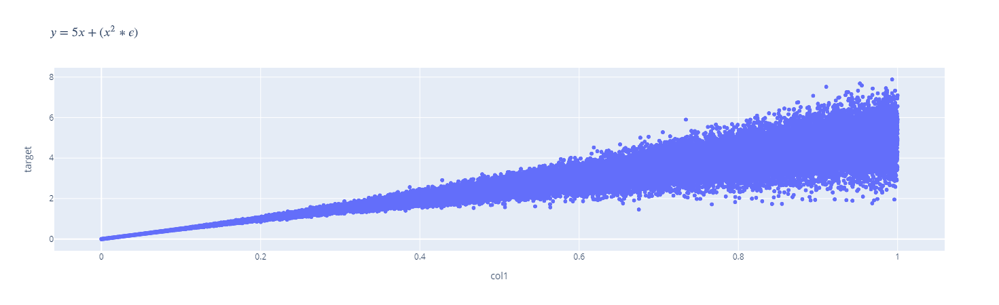

In [14]:
# display(Math(r"$y = 5x + (x^2 * \epsilon)$"+"\n"+r"$\epsilon \backsim \mathcal{N}(0,1)$"))
fig = px.scatter(df_train, x="col1", y="target", title=r"$y = 5x + (x^2 * \epsilon)$"+"\n"+r"$\epsilon \backsim \mathcal{N}(0,1)$")
fig

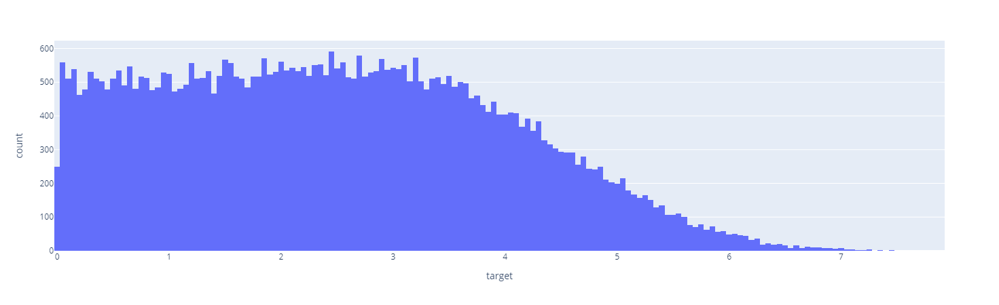

In [15]:
px.histogram(df_train, x="target")

## Training the MDN

### Define the Configs

In [11]:
epochs = 15
batch_size = 128
steps_per_epoch = int((len(df_train)//batch_size)*0.9)
data_config = DataConfig(
    target=['target'],
    continuous_cols=['col1'],
    categorical_cols=[],
#         continuous_feature_transform="quantile_uniform"
)
trainer_config = TrainerConfig(
    auto_lr_find=True, # Runs the LRFinder to automatically derive a learning rate
    batch_size=batch_size,
    max_epochs=epochs,
    early_stopping_patience = 5,
    gpus=1, #index of the GPU to use. 0, means CPU
)
# optimizer_config = OptimizerConfig(lr_scheduler="OneCycleLR", lr_scheduler_params={"max_lr":0.005, "epochs": epochs, "steps_per_epoch":steps_per_epoch})
optimizer_config = OptimizerConfig(lr_scheduler="ReduceLROnPlateau", lr_scheduler_params={"patience":3})
mdn_config = MixtureDensityHeadConfig(num_gaussian=1)
model_config = CategoryEmbeddingMDNConfig(
    task="regression",
    mdn_config=mdn_config,
    layers="128-64",  # Number of nodes in each layer
    activation="ReLU",  # Activation between each layers
    learning_rate=1e-3,
    batch_norm_continuous_input=True,
    use_batch_norm=True,
    dropout=0.0,
    embedding_dropout=0,
    initialization="kaiming",
    #         target_range=[(df_train[col].min(),df_train[col].max()) for col in ['target']]
)
tabular_model = TabularModel(
    data_config=data_config,
    model_config=model_config,
    optimizer_config=optimizer_config,
    trainer_config=trainer_config
)

### Training the Model 

In [12]:
tabular_model.fit(train=df_train, validation=df_valid)

d:\playground\tabular\pytorch-tabular\env\lib\site-packages\pytorch_lightning-1.1.0-py3.8.egg\pytorch_lightning\utilities\distributed.py:49: UserWarning:

Checkpoint directory saved_models exists and is not empty. With save_top_k=1, all files in this directory will be deleted when a checkpoint is saved!

GPU available: True, used: False
TPU available: None, using: 0 TPU cores
d:\playground\tabular\pytorch-tabular\env\lib\site-packages\pytorch_lightning-1.1.0-py3.8.egg\pytorch_lightning\utilities\distributed.py:49: UserWarning:

GPU available but not used. Set the --gpus flag when calling the script.

GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                | Params
---------------------------------------------------------------
0 | embedding_layers       | ModuleList          | 0     
1 | normalizing_batch_norm | BatchNorm1d         | 2     
2 | backbone               | FeedForwar

LR finder stopped early due to diverging loss.
Learning rate set to 0.0007585775750291836

  | Name                   | Type                | Params
---------------------------------------------------------------
0 | embedding_layers       | ModuleList          | 0     
1 | normalizing_batch_norm | BatchNorm1d         | 2     
2 | backbone               | FeedForwardBackbone | 8.8 K 
3 | mdn                    | MixtureDensityHead  | 194   
4 | loss                   | MSELoss             | 0     
---------------------------------------------------------------
9.0 K     Trainable params
0         Non-trainable params
9.0 K     Total params


### Predictions and Visualization

In [13]:
pred_df = tabular_model.predict(df_test, quantiles=[0.25,0.5,0.75], n_samples=100)
pred_df.head()

,col1,target_prediction,target_q25,target_q50,target_q75
0,0.000000,0.557552,0.034879,0.529242,1.042608
1,0.001001,0.491563,0.060616,0.464388,0.941083
2,0.002002,0.470586,0.050584,0.462707,0.815913
3,0.003003,0.458056,0.066159,0.482623,0.892413
4,0.004004,0.430301,0.036575,0.387163,0.861861


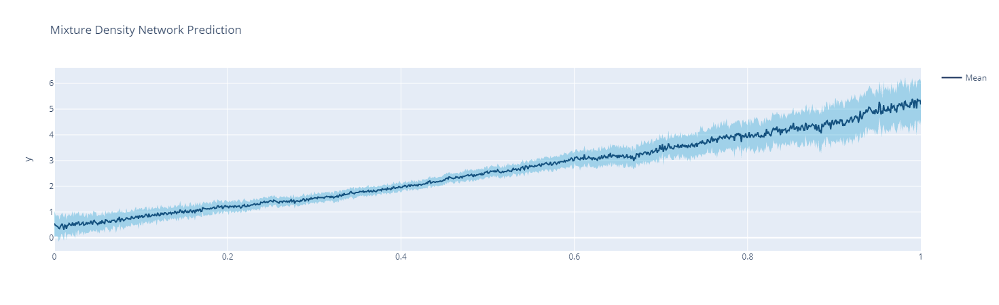

In [14]:
fig = go.Figure([
    go.Scatter(
        name='Mean',
        x=pred_df['col1'],
        y=pred_df['target_prediction'],
        mode='lines',
        line=dict(color='rgba(28,53,94,1)'),
    ),
    go.Scatter(
        name='Upper Bound',
        x=pred_df['col1'],
        y=pred_df['target_q75'],
        mode='lines',
        marker=dict(color='rgba(0,147,201,0.3)'),
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound',
        x=pred_df['col1'],
        y=pred_df['target_q25'],
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(0,147,201,0.3)',
        fill='tonexty',
        showlegend=False
    )
])
fig.update_layout(
    yaxis_title='y',
    title='Mixture Density Network Prediction',
    hovermode="x"
)
fig.show()

# Non-Linear Example

In [16]:
df_train, df_valid, df_test, target_col = generate_non_linear_example()

## Plot

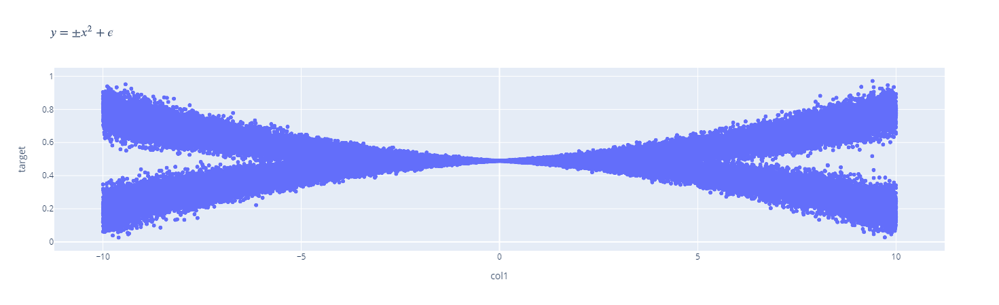

In [17]:
fig = px.scatter(df_train, x="col1", y="target", title=r"$y = \pm x^2 + \epsilon$"+"\n"+r"$\epsilon\backsim\mathcal{N}(0,|x|)$")
fig

## Training a FeedForward

### Define the Configs

In [20]:
epochs = 200
batch_size = 2048
steps_per_epoch = int((len(df_train)//batch_size)*0.9)
data_config = DataConfig(
    target=['target'],
    continuous_cols=['col1'],
    categorical_cols=[],
#         continuous_feature_transform="quantile_uniform"
)
trainer_config = TrainerConfig(
    auto_lr_find=True, # Runs the LRFinder to automatically derive a learning rate
    batch_size=batch_size,
    max_epochs=epochs,
    early_stopping_patience = 5,
    gpus=1, #index of the GPU to use. 0, means CPU
)
# optimizer_config = OptimizerConfig(lr_scheduler="OneCycleLR", lr_scheduler_params={"max_lr":0.005, "epochs": epochs, "steps_per_epoch":steps_per_epoch})
optimizer_config = OptimizerConfig(lr_scheduler="ReduceLROnPlateau", lr_scheduler_params={"patience":3})
model_config = CategoryEmbeddingModelConfig(
    task="regression",
    layers="8",  # Number of nodes in each layer
    activation="ReLU",  # Activation between each layers
    learning_rate=1e-3,
    batch_norm_continuous_input=True,
    use_batch_norm=True,
    dropout=0.0,
    embedding_dropout=0,
    initialization="kaiming",
    #         target_range=[(df_train[col].min(),df_train[col].max()) for col in ['target']]
)
tabular_model = TabularModel(
    data_config=data_config,
    model_config=model_config,
    optimizer_config=optimizer_config,
    trainer_config=trainer_config
)

### Training the Model 

In [21]:
tabular_model.fit(train=df_train, validation=df_valid)

d:\playground\tabular\pytorch-tabular\env\lib\site-packages\pytorch_lightning-1.1.0-py3.8.egg\pytorch_lightning\utilities\distributed.py:49: UserWarning:

Checkpoint directory saved_models exists and is not empty. With save_top_k=1, all files in this directory will be deleted when a checkpoint is saved!

GPU available: True, used: False
TPU available: None, using: 0 TPU cores
d:\playground\tabular\pytorch-tabular\env\lib\site-packages\pytorch_lightning-1.1.0-py3.8.egg\pytorch_lightning\utilities\distributed.py:49: UserWarning:

GPU available but not used. Set the --gpus flag when calling the script.

GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                | Params
---------------------------------------------------------------
0 | embedding_layers       | ModuleList          | 0     
1 | normalizing_batch_norm | BatchNorm1d         | 2     
2 | backbone               | FeedForwar

Learning rate set to 0.025118864315095822

  | Name                   | Type                | Params
---------------------------------------------------------------
0 | embedding_layers       | ModuleList          | 0     
1 | normalizing_batch_norm | BatchNorm1d         | 2     
2 | backbone               | FeedForwardBackbone | 18    
3 | output_layer           | Linear              | 9     
4 | loss                   | MSELoss             | 0     
---------------------------------------------------------------
29        Trainable params
0         Non-trainable params
29        Total params


### Predictions and Visualization

In [22]:
pred_df = tabular_model.predict(df_valid.sample(1000).sort_values("col1"))
pred_df.head()

,col1,target,target_prediction
53674,-9.926827,0.753673,0.539488
14595,-9.919505,0.804470,0.539372
72213,-9.915694,0.780806,0.539312
72410,-9.903859,0.209521,0.539125
9859,-9.883506,0.812582,0.538804


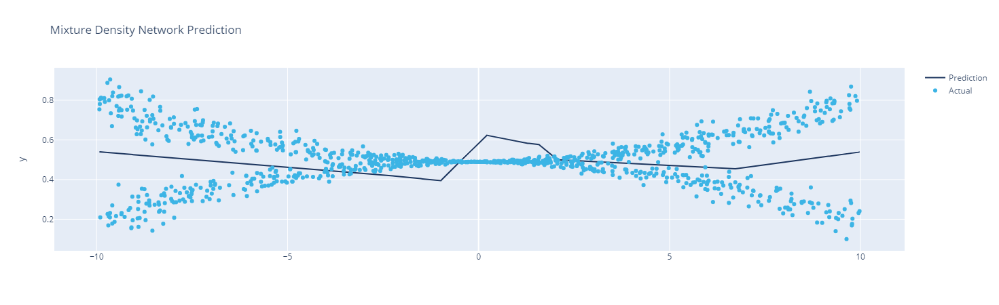

In [23]:
fig = go.Figure([
    go.Scatter(
        name='Prediction',
        x=pred_df['col1'],
        y=pred_df['target_prediction'],
        mode='lines',
        line=dict(color='rgba(28,53,94,1)'),
    ),
    go.Scatter(
        name='Actual',
        x=pred_df['col1'],
        y=pred_df['target'],
        mode='markers',
        line=dict(color='rgba(60,180,229,1)'),
    ),
])
fig.update_layout(
    yaxis_title='y',
    title='Mixture Density Network Prediction',
    hovermode="x"
)
fig.show()

## Training the MDN

### Define the Configs

In [29]:
epochs = 200
batch_size = 2048
steps_per_epoch = int((len(df_train)//batch_size)*0.9)
data_config = DataConfig(
    target=['target'],
    continuous_cols=['col1'],
    categorical_cols=[],
#         continuous_feature_transform="quantile_uniform"
)
trainer_config = TrainerConfig(
    auto_lr_find=True, # Runs the LRFinder to automatically derive a learning rate
    batch_size=batch_size,
    max_epochs=epochs,
    early_stopping_patience = 5,
    early_stopping=None,
    gpus=1, #index of the GPU to use. 0, means CPU
)
# optimizer_config = OptimizerConfig(lr_scheduler="OneCycleLR", lr_scheduler_params={"max_lr":0.005, "epochs": epochs, "steps_per_epoch":steps_per_epoch})
optimizer_config = OptimizerConfig(lr_scheduler="ReduceLROnPlateau", lr_scheduler_params={"patience":3})
mdn_config = MixtureDensityHeadConfig(num_gaussian=2, weight_regularization=2)#, mu_bias_init=[0.3, 0.7])
model_config = CategoryEmbeddingMDNConfig(
    task="regression",
    mdn_config=mdn_config,
    layers="8",  # Number of nodes in each layer
    activation="ReLU",  # Activation between each layers
    learning_rate=1e-3,
    batch_norm_continuous_input=True,
    use_batch_norm=True,
    dropout=0.0,
    embedding_dropout=0,
    initialization="kaiming",
    #         target_range=[(df_train[col].min(),df_train[col].max()) for col in ['target']]
)
tabular_model = TabularModel(
    data_config=data_config,
    model_config=model_config,
    optimizer_config=optimizer_config,
    trainer_config=trainer_config
)

### Training the Model 

In [ ]:
tabular_model.fit(train=df_train, validation=df_valid)

d:\playground\tabular\pytorch-tabular\env\lib\site-packages\pytorch_lightning-1.1.0-py3.8.egg\pytorch_lightning\utilities\distributed.py:49: UserWarning:

Checkpoint directory saved_models exists and is not empty. With save_top_k=1, all files in this directory will be deleted when a checkpoint is saved!

GPU available: True, used: False
TPU available: None, using: 0 TPU cores
d:\playground\tabular\pytorch-tabular\env\lib\site-packages\pytorch_lightning-1.1.0-py3.8.egg\pytorch_lightning\utilities\distributed.py:49: UserWarning:

GPU available but not used. Set the --gpus flag when calling the script.

GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                | Params
---------------------------------------------------------------
0 | embedding_layers       | ModuleList          | 0     
1 | normalizing_batch_norm | BatchNorm1d         | 2     
2 | backbone               | FeedForwar

Learning rate set to 0.01

  | Name                   | Type                | Params
---------------------------------------------------------------
0 | embedding_layers       | ModuleList          | 0     
1 | normalizing_batch_norm | BatchNorm1d         | 2     
2 | backbone               | FeedForwardBackbone | 18    
3 | mdn                    | MixtureDensityHead  | 52    
4 | loss                   | MSELoss             | 0     
---------------------------------------------------------------
72        Trainable params
0         Non-trainable params
72        Total params


### Predictions and Visualization

In [27]:
pred_df = tabular_model.predict(df_test, quantiles=[0.25,0.5,0.75], n_samples=100, ret_logits=True)
pred_df.head()

,col1,target_prediction,target_q25,target_q50,target_q75,pi_0,pi_1,sigma_0,sigma_1,mu_0,mu_1
0,-10.000000,0.513576,0.204932,0.721090,0.787624,-0.047801,0.047841,0.052749,0.048175,0.199004,0.777130
1,-9.979980,0.383330,0.202890,0.239695,0.747035,-0.047338,0.047378,0.052725,0.048184,0.199936,0.776219
2,-9.959960,0.351975,0.178606,0.228061,0.717388,-0.046875,0.046915,0.052701,0.048194,0.200869,0.775308
3,-9.939939,0.489790,0.214869,0.294361,0.778957,-0.046412,0.046451,0.052677,0.048203,0.201802,0.774397
4,-9.919920,0.203642,0.161666,0.199165,0.240922,-0.045949,0.045988,0.052653,0.048213,0.202734,0.773486


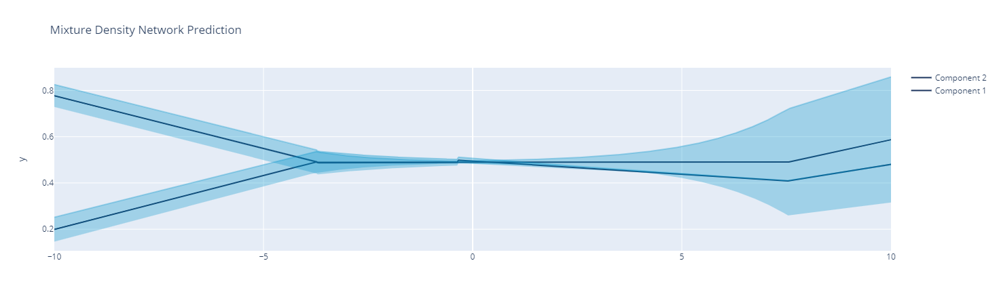

In [28]:
fig = go.Figure([
    go.Scatter(
        name='Component 1',
        x=pred_df['col1'],
        y=pred_df['mu_0'],
        mode='lines',
        line=dict(color='rgba(28,53,94,1)'),
    ),
    go.Scatter(
        name='Component 2',
        x=pred_df['col1'],
        y=pred_df['mu_1'],
        mode='lines',
        line=dict(color='rgba(28,53,94,1)'),
    ),
    go.Scatter(
        name='Upper Bound 1',
        x=pred_df['col1'],
        y=pred_df['mu_0']+pred_df['sigma_0'],
        mode='lines',
        marker=dict(color='rgba(0,147,201,0.3)'),
#         line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound 1',
        x=pred_df['col1'],
        y=pred_df['mu_0']-pred_df['sigma_0'],
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(0,147,201,0.3)',
        fill='tonexty',
        showlegend=False
    ),
    go.Scatter(
        name='Upper Bound 2',
        x=pred_df['col1'],
        y=pred_df['mu_1']+pred_df['sigma_1'],
        mode='lines',
        marker=dict(color='rgba(0,147,201,0.3)'),
#         line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound 2',
        x=pred_df['col1'],
        y=pred_df['mu_1']-pred_df['sigma_1'],
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(0,147,201,0.3)',
        fill='tonexty',
        showlegend=False
    ),
])
fig.update_layout(
    yaxis_title='y',
    title='Mixture Density Network Prediction',
    hovermode="x"
)
fig.show()

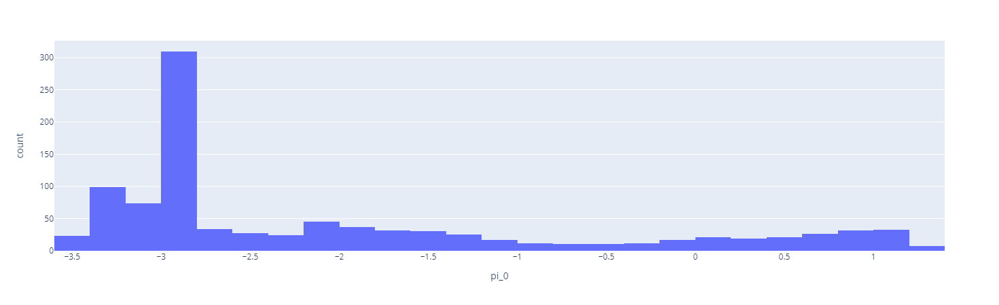

In [59]:
px.histogram(pred_df, x="pi_0")